# Credit Card Fraud Detection

## Problem Statement:

The given dataset is a result of PCA dimensions, Last Transaction Time and Amount .Based on the features whose nature is unknown and relevance is ambiguous in terms of business KPIs, We have to build an ML model for Identifying whether a transaction is fraudulent or not and minimise the cost associated with wrong predictions of Fraudulent transactions as genuine and Incorrect classification of genuine transaction as fraudulent . We are using Recall of the Incorrect classifier to optimize the model with desired performance

### METHODOLOGY

In [0]:
#Imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

####  Section 1: Importing data

##### Option 1 : From Drive in Colab

In [2]:
#Mounting the drive
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#Customize directory based on your path
credit_df = pd.read_csv('/content/drive/My Drive/creditcard.csv')

##### Option 2: From local Directory in Folder of ipynb file for jupyter notebook etc.

In [0]:
credit_df=pd.read_csv('creditcard.csv')

## Exploratory Data Analysis

In [0]:
credit=credit_df # To create a backup of dataframe for future use

In [0]:
### To get all columns and rows at call of dataframes and variables without data occlusion
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [0]:
#A quick analysis of variables and observations
credit_df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


 Since all data is numeric we dont need to do numeric transformation of categorical variables

In [0]:
credit_df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,1.768627e-15,9.170318e-16,-1.810658e-15,1.693438e-15,1.479045e-15,3.482336e-15,1.392007e-15,-7.528491e-16,4.328772e-16,9.049732e-16,5.085503e-16,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


All features are obtained from PCA other than Time and Amount we assume there exists no significance multicolinearity that than impair our interpretation with the data. It is not necessary to do correlation based feature selection as there are just 30 variables for prediction.

In [0]:
#Identify data types and number of non null values
credit_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
Time      284807 non-null float64
V1        284807 non-null float64
V2        284807 non-null float64
V3        284807 non-null float64
V4        284807 non-null float64
V5        284807 non-null float64
V6        284807 non-null float64
V7        284807 non-null float64
V8        284807 non-null float64
V9        284807 non-null float64
V10       284807 non-null float64
V11       284807 non-null float64
V12       284807 non-null float64
V13       284807 non-null float64
V14       284807 non-null float64
V15       284807 non-null float64
V16       284807 non-null float64
V17       284807 non-null float64
V18       284807 non-null float64
V19       284807 non-null float64
V20       284807 non-null float64
V21       284807 non-null float64
V22       284807 non-null float64
V23       284807 non-null float64
V24       284807 non-null float64
V25       284807 non-null float64
V26  

#### There exists no null values or missing values

In [0]:
#Displays number of rows(predictors) and columns(target) in the dataset
print('Number of features: {}'.format(credit_df.shape[1]-1))
print('Number of examples: {}'.format(credit_df.shape[0]))

Number of features: 30
Number of examples: 284807


In [0]:
Number_of_obs_0=credit_df[credit_df['Class']==0].shape[0]
print('Number of non-fraudulent transactions= '+ str(Number_of_obs_0))

Number of non-fraudulent transactions= 284315


In [0]:
Number_of_obs_1=credit_df[credit_df['Class']==1].shape[0]
print('Number of fraudulent transactions= '+ str(Number_of_obs_1))

Number of fraudulent transactions= 492


In [0]:
imbalance_ratio=Number_of_obs_0/Number_of_obs_1
print('Class Imbalance ratio (Non-fraud to fraud) is {} : 1 '.format(int(imbalance_ratio)))

Class Imbalance ratio (Non-fraud to fraud) is 577 : 1 


### Fraudulent versus Non-Fraudulent class Ratio: 1:577 ~ Highly imbalanced

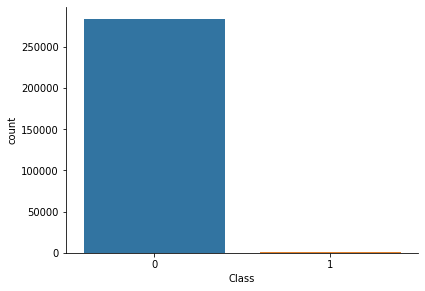

In [0]:
sns.catplot(x='Class', kind='count' ,data=credit_df, )
fig = plt.gcf()
fig.set_size_inches(6, 4)

In [0]:
c=credit[list(credit)].corr()# Correlation in various variables, Self Contribution
c

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,1.173963e-01,-1.059333e-02,-4.196182e-01,-1.052602e-01,1.730721e-01,-6.301647e-02,8.471437e-02,-3.694943e-02,-8.660434e-03,3.061663e-02,-2.476894e-01,1.243481e-01,-6.590202e-02,-9.875682e-02,-1.834533e-01,1.190287e-02,-7.329721e-02,9.043813e-02,2.897530e-02,-5.086602e-02,4.473573e-02,1.440591e-01,5.114236e-02,-1.618187e-02,-2.330828e-01,-4.140710e-02,-5.134591e-03,-9.412688e-03,-0.010596,-0.012323
V1,0.117396,1.000000e+00,4.697350e-17,-1.424390e-15,1.755316e-17,6.391162e-17,2.398071e-16,1.991550e-15,-9.490675e-17,2.169581e-16,7.433820e-17,2.438580e-16,2.422086e-16,-2.115458e-16,9.352582e-16,-3.252451e-16,6.308789e-16,-5.011524e-16,2.870125e-16,1.818128e-16,1.036959e-16,-1.755072e-16,7.477367e-17,9.808705e-16,7.354269e-17,-9.805358e-16,-8.621897e-17,3.208233e-17,9.820892e-16,-0.227709,-0.101347
V2,-0.010593,4.697350e-17,1.000000e+00,2.512175e-16,-1.126388e-16,-2.039868e-16,5.024680e-16,3.966486e-16,-4.413984e-17,-5.728718e-17,-4.782388e-16,9.468995e-16,-6.588252e-16,3.854521e-16,-2.541036e-16,2.831060e-16,4.934097e-17,-9.883008e-16,2.636654e-16,9.528280e-17,-9.309954e-16,8.444409e-17,2.500830e-16,1.059562e-16,-8.142354e-18,-4.261894e-17,2.601622e-16,-4.478472e-16,-3.676415e-16,-0.531409,0.091289
V3,-0.419618,-1.424390e-15,2.512175e-16,1.000000e+00,-3.416910e-16,-1.436514e-15,1.431581e-15,2.168574e-15,3.433113e-16,-4.233770e-16,6.289267e-16,-5.501758e-17,2.206522e-16,-6.883375e-16,4.271336e-16,1.122756e-16,1.183364e-15,4.576619e-17,5.427965e-16,2.576773e-16,-9.429297e-16,-2.971969e-17,4.648259e-16,2.115206e-17,-9.351637e-17,4.771164e-16,6.521501e-16,6.239832e-16,7.726948e-16,-0.210880,-0.192961
V4,-0.105260,1.755316e-17,-1.126388e-16,-3.416910e-16,1.000000e+00,-1.940929e-15,-2.712659e-16,1.556330e-16,5.195643e-16,3.859585e-16,6.055490e-16,-2.083600e-16,-5.657963e-16,-1.506129e-16,-8.522435e-17,-1.507718e-16,-6.939204e-16,-4.397925e-16,1.493667e-16,-2.656938e-16,-3.223123e-16,-9.976950e-17,2.099922e-16,6.002528e-17,2.229738e-16,5.394585e-16,-6.179751e-16,-6.403423e-17,-5.863664e-17,0.098732,0.133447
V5,0.173072,6.391162e-17,-2.039868e-16,-1.436514e-15,-1.940929e-15,1.000000e+00,7.926364e-16,-4.209851e-16,7.589187e-16,4.205206e-16,-6.601716e-16,7.342759e-16,3.761033e-16,-9.578659e-16,-3.634803e-16,-5.132620e-16,-3.517076e-16,1.425729e-16,1.109525e-15,-3.138234e-16,2.076048e-16,-1.368701e-16,5.060029e-16,1.637596e-16,-9.286095e-16,5.625102e-16,9.144690e-16,4.465960e-16,-3.299167e-16,-0.386356,-0.094974
V6,-0.063016,2.398071e-16,5.024680e-16,1.431581e-15,-2.712659e-16,7.926364e-16,1.000000e+00,1.429426e-16,-1.707421e-16,1.114447e-16,2.850776e-16,4.865799e-16,2.140589e-16,-2.268061e-16,3.452801e-16,-6.368111e-18,-2.477917e-16,3.567582e-16,2.811474e-16,2.717167e-16,1.898638e-16,-1.575903e-16,-3.362902e-16,-7.232186e-17,-1.261867e-15,1.081933e-15,-2.378414e-16,-2.623818e-16,4.813155e-16,0.215981,-0.043643
V7,0.084714,1.991550e-15,3.966486e-16,2.168574e-15,1.556330e-16,-4.209851e-16,1.429426e-16,1.000000e+00,-8.691834e-17,7.933251e-16,3.043333e-17,-1.084105e-15,1.510045e-15,-9.892325e-17,-1.729462e-16,1.936832e-17,2.893672e-16,1.149692e-15,-1.116789e-16,-2.874017e-16,1.744242e-16,1.938604e-16,-1.058131e-15,2.327911e-16,-2.589727e-17,1.174169e-15,-7.334507e-16,-5.886825e-16,-6.836764e-17,0.397311,-0.187257
V8,-0.036949,-9.490675e-17,-4.413984e-17,3.433113e-16,5.195643e-16,7.589187e-16,-1.707421e-16,-8.691834e-17,1.000000e+00,2.900829e-16,9.051847e-17,1.954747e-16,-6.266057e-17,-2.382948e-16,-1.131098e-16,2.021491e-16,5.027192e-16,-3.508777e-16,-4.093852e-16,-5.339821e-16,-1.095534e-16,-2.412439e-16,5.475559e-16,3.897104e-16,-1.802967e-16,-1.390791e-16,-1.209975e-16,1.733633e-16,-4.484325e-16,-0.103079,0.019875
V9,-0.008660,2.169581e-16,-5.728718e-17,-4.233770e-16,3.859585e-16,4.205206e-16,1.114447e-16,7.933251e-16,2.900829e-16,1.000000e+00,-2.771761e-16,4.682341e-16,-2.445230e-15,-2.650351e-16,2.343317e-

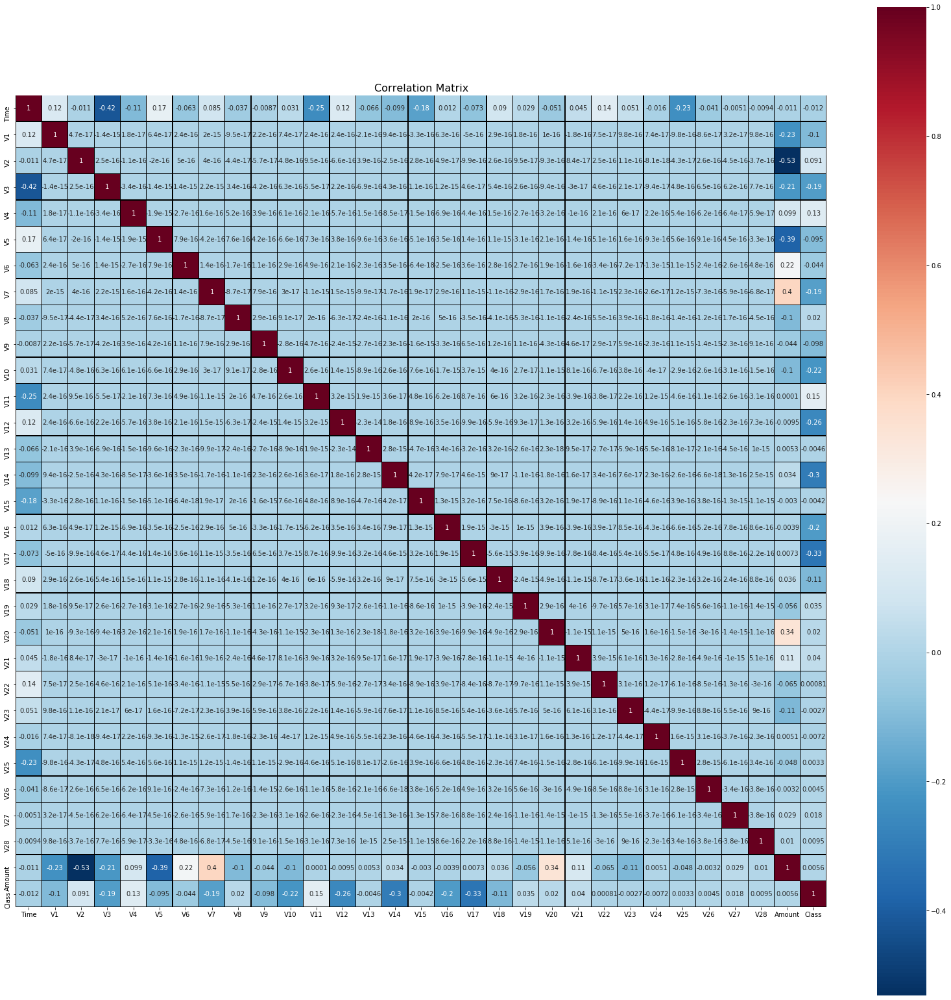

In [0]:
f, ax = plt.subplots(figsize=(28,28))#Plots correlation matrix, Self Contribution
plt.title('Correlation Matrix',fontsize=16)
sns.heatmap(c, linewidths=0.25, vmax=1.0, square=True, cmap="RdBu_r", linecolor='k', annot=True)

### There is not much correlation(Any strong Correlation) between any of the variables. We cannot remove similar features. If we have to highest corr is between Amount and V2 and Amount and V7. Correlation doesn't guarantee that both exhibit equal or similar classification across distribution

In [0]:
X = credit_df.drop('Class', axis=1)
y = credit_df['Class']
# Scatterplot

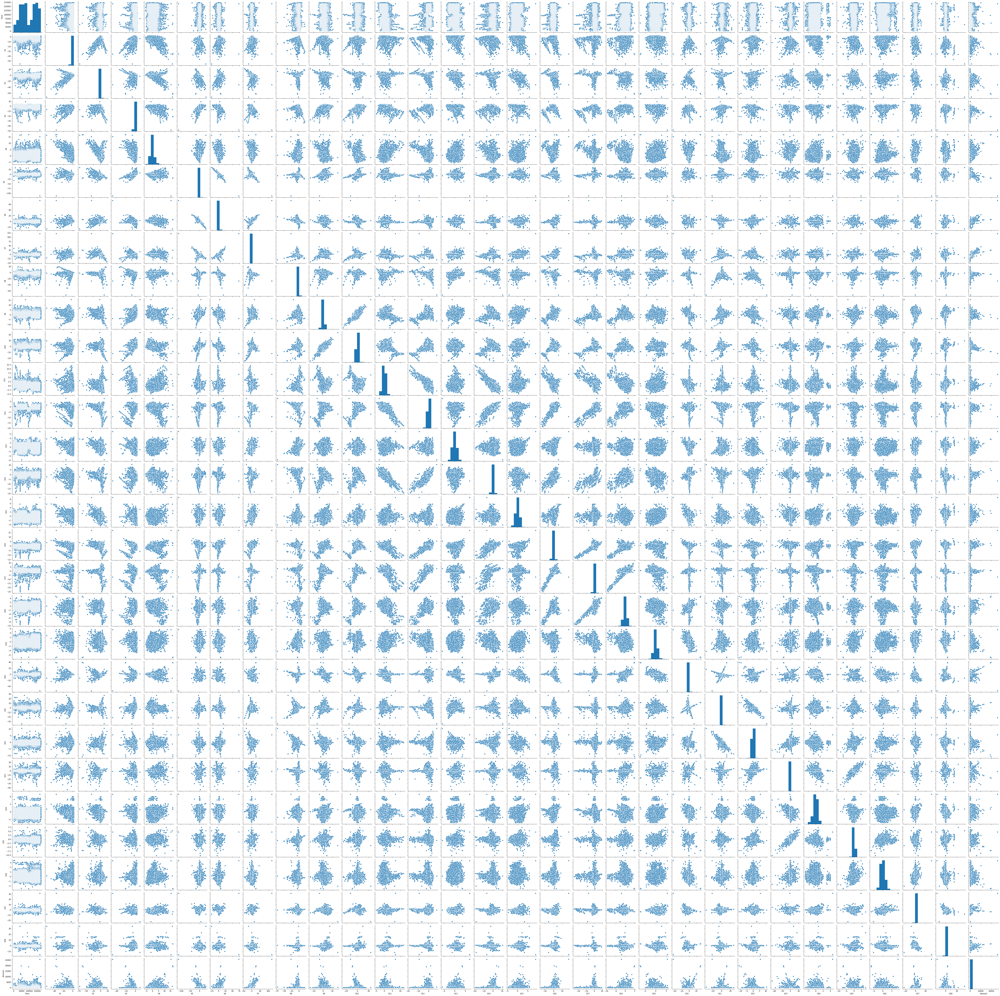

In [0]:
sns.pairplot(credit_df, x_vars=list(X.columns),y_vars=list(X.columns))

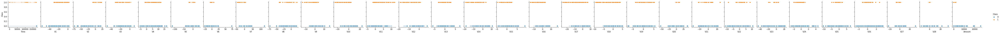

In [0]:
sns.pairplot(credit_df, x_vars=list(X.columns),y_vars=['Class'], hue='Class')



- **Graphically** we see that the Scatterplot demonstrate no general trend between the variables. This is due to the fact that PCA engineers new features that are **orthogonal** to each other and dont exhibit colinearity. The correlation matrix with correlation values further backs this result.
- Moreover there exists relationship between values of these variables to fraud and since it is an imbalanced class we should preserve these features as they help us find fraud and graphical methods aren't helping much to eliminate any feature

## Understand distribution of Amount with respect to fraud non fraud

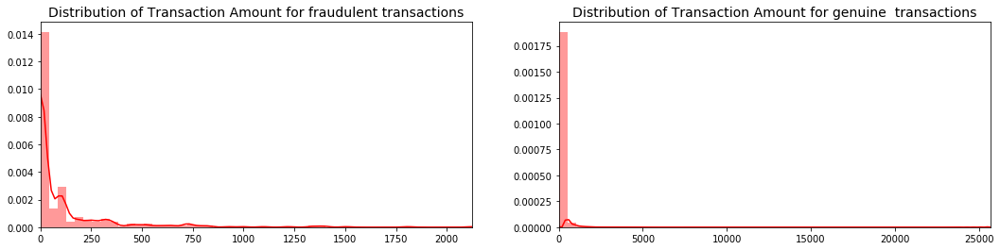

In [0]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

fraudulent_amount=(credit['Amount'][credit['Class']==1]).values
sns.distplot(fraudulent_amount, ax=ax[0], color='r')
ax[0].set_title('Distribution of Transaction Amount for fraudulent transactions', fontsize=14)
ax[0].set_xlim([min(fraudulent_amount), max(fraudulent_amount)])

fraudulent_amount=(credit['Amount'][credit['Class']==0]).values
sns.distplot(fraudulent_amount, ax=ax[1], color='r')
ax[1].set_title('Distribution of Transaction Amount for genuine  transactions', fontsize=14)
ax[1].set_xlim([min(fraudulent_amount), max(fraudulent_amount)])
plt.show()



#### Amount is skewed to the right and needs to get normalized to reflect interpretable results with variance of outcome

In [0]:
# Relationship to the fraud classification and features
import statsmodels.api as sm
logit_model=sm.Logit(y,X)
result=logit_model.fit()
print(result.summary2())


Optimization terminated successfully.
         Current function value: 0.009803
         Iterations 12
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.229    
Dependent Variable: Class            AIC:              5644.0027
Date:               2020-03-16 20:54 BIC:              5960.7897
No. Observations:   284807           Log-Likelihood:   -2792.0  
Df Model:           29               LL-Null:          -3621.2  
Df Residuals:       284777           LLR p-value:      0.0000   
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     12.0000                                     
-----------------------------------------------------------------
             Coef.   Std.Err.     z      P>|z|    [0.025   0.975]
-----------------------------------------------------------------
Time        -0.0001    0.0000  -55.8919  0.0000  -0.0001  -0.0001
V1           0.5835    0.0336   17.3521  0.0000   0.5176   0.6494
V2     

In [0]:
X_new = X.drop('V24', axis=1)
logit_model=sm.Logit(y,X_new)
result=logit_model.fit()
print(result.summary2())


Optimization terminated successfully.
         Current function value: 0.009805
         Iterations 12
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.229    
Dependent Variable: Class            AIC:              5643.0442
Date:               2020-03-16 22:01 BIC:              5949.2716
No. Observations:   284807           Log-Likelihood:   -2792.5  
Df Model:           28               LL-Null:          -3621.2  
Df Residuals:       284778           LLR p-value:      0.0000   
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     12.0000                                     
-----------------------------------------------------------------
             Coef.   Std.Err.     z      P>|z|    [0.025   0.975]
-----------------------------------------------------------------
Time        -0.0001    0.0000  -56.0599  0.0000  -0.0001  -0.0001
V1           0.5849    0.0336   17.4046  0.0000   0.5190   0.6507
V2     

In [0]:
X_new = X.drop(['V24','V12'], axis=1)
logit_model=sm.Logit(y,X_new)
result=logit_model.fit()
print(result.summary2())


Optimization terminated successfully.
         Current function value: 0.009809
         Iterations 12
                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.229    
Dependent Variable: Class            AIC:              5643.2134
Date:               2020-03-16 22:05 BIC:              5938.8812
No. Observations:   284807           Log-Likelihood:   -2793.6  
Df Model:           27               LL-Null:          -3621.2  
Df Residuals:       284779           LLR p-value:      0.0000   
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     12.0000                                     
-----------------------------------------------------------------
             Coef.   Std.Err.     z      P>|z|    [0.025   0.975]
-----------------------------------------------------------------
Time        -0.0001    0.0000  -56.5288  0.0000  -0.0001  -0.0001
V1           0.5932    0.0333   17.8388  0.0000   0.5280   0.6584
V2     

### -The importances are given by significance value, higher the significance, higher the importance of the feature. Time, V3, V2, Amount are most significant. V24, V12, V23, V26, V28 are least significant.

### However, This model doesn't explain much variance in the data given R2 value.

### -This is due to imbalanced classes and also probability of inability of variable - output linear relationship or both 
### We choose to not eliminate any feature given they might be strong signals  of minority class classification

### Chi Square test for Feature Selection ( Filter Method)

In [0]:
# Top 20 features
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler
X_norm = MinMaxScaler().fit_transform(X)
chi_selector = SelectKBest(chi2, k=20)
chi_selector.fit(X_norm, y)
chi_support = chi_selector.get_support()
chi_feature = X.loc[:,chi_support].columns.tolist()
print(str(len(chi_feature)), 'selected features')
print(chi_feature)


20 selected features
['scAmount', 'scTime', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12', 'V14', 'V16', 'V17', 'V18', 'V19', 'V21', 'V24']


#### Since F test also doesnt imply  that one variable's inability to predict outcome in extreme or within distribution we move ahead with all variables in circumstances that neither constraints nor nature of original variables are known 

###  Wrapper Method for  feature selection Recursive Feature Elimination 

In [0]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
rfe_selector = RFE(estimator=LogisticRegression(), n_features_to_select=20, step=10, verbose=5)
rfe_selector.fit(X_norm, y)
rfe_support = rfe_selector.get_support()
rfe_feature = X.loc[:,rfe_support].columns.tolist()
print(str(len(rfe_feature)), 'selected features')
print(rfe_feature)


Fitting estimator with 30 features.


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


20 selected features
['scTime', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V21', 'V22', 'V24', 'V25']


### Embedded Method using Random Forest

In [0]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
## Using Random forest for feature selection
embeded_rf_selector = SelectFromModel(RandomForestClassifier(n_estimators=100), max_features=20)
embeded_rf_selector.fit(X, y)

embeded_rf_support = embeded_rf_selector.get_support()
embeded_rf_feature = X.loc[:,embeded_rf_support].columns.tolist()
print(str(len(embeded_rf_feature)), 'selected features')
print(embeded_rf_feature)

7 selected features
['V4', 'V10', 'V11', 'V12', 'V14', 'V16', 'V17']


# Evaluation Metric:

#### Here in this creditcard transaction problem 
### TP= Predicted Fraud that were fraudulent transactions
### TN= Predicted non-fraudulent in genuine transactions
### FP= Predicted Fraud for genuine transaction
### FN= Predicted Non-fraud for fraudulent transaction. Very Dangerous.
#### Precision= TP/(TP+FP)
#### Recall= TP/(TP+FN)
#### F1 score= Harmonic mean of precision and recall
### Given: FN is 4 times more costly than FP we concentrate on minimizing Type 2 error. We focus on **Recall Score**

### We always **undersample/ oversample during CV step** to avoid leakage of training on hold out validation set

### We consider **Recall of minority class** and secondly** Precision of majority class** and most importantly Recall has to be maximized to avoid incorrect classification of fraud transaction as not-fraud


# Methods of dealing with class imbalance

### Oversampling and undersampling are 2 methods of resolving class imbalance 
### Oversampling simply means adding more observations of minority class by approximations/randommly etc. 
Oversampling is tedious in terms of computation
We have no proof that the minority class will look like syntHetic data which might overfit the minority class,
 Linear models can be applied , No data loss
#### We can use SMOTE and its variations for oversampling like SMOTE, SMOTE+ENN, SMOTE+
### Undersampling means to remove observations of majority class by threshholds/ approximations, neighbourhood, randommly
Computationally easy, Loss of information about majority class, loss of precision, Type I error increases
#### We can use NearMiss algorithms for undersampling.

#### Imports

In [42]:
# Data Processing
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import time

# Classifier Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import collections


# Other Libraries 
from sklearn.model_selection import train_test_split # To split the data in test and train sets
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline 
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report
from collections import Counter
from sklearn.model_selection import KFold, StratifiedKFold


/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


#### Scaling

In [0]:
# Since most of our data has already been scaled we should scale the columns that are left to scale (Amount and Time)
from sklearn.preprocessing import StandardScaler, RobustScaler

# RobustScaler is less prone to outliers.
std_scaler = StandardScaler()
rob_scaler = RobustScaler()

# Squishing values of Amount and time to -1:1
credit['scAmount'] = rob_scaler.fit_transform(credit['Amount'].values.reshape(-1,1))
credit['scTime'] = rob_scaler.fit_transform(credit['Time'].values.reshape(-1,1))

credit.drop(['Time','Amount'], axis=1, inplace=True)

scaled_amount = credit['scAmount']
scaled_time = credit['scTime']

credit.drop(['scAmount', 'scTime'], axis=1, inplace=True)
credit.insert(0, 'scAmount', scaled_amount)
credit.insert(1, 'scTime', scaled_time)

# Amount and Time are Scaled!

credit.head()


,scAmount,scTime,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
0,1.783274,-0.994983,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0
1,-0.269825,-0.994983,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0
2,4.983721,-0.994972,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0
3,1.418291,-0.994972,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0
4,0.670579,-0.994960,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0


# Test Train Split
### We choose a test-train split to assign almost **(2/3)rds** of our data to **training** and **(1/3)rd to testing**. 

### This is vital as we want to ensure that we do thourough testing of the model before putting it up for production.

### A model with imbalance class ratio  as high as this must provide adequate minority class observation for training around 66% and adequate amount for testing around 33%.
### Had we chosen 80:20 we would not be confident of the model's performance with random test data and 50:50 ensures that we dont train properly as we are about to fix imbalance classes and approximations might be misleading.

In [7]:
from sklearn.model_selection import train_test_split
# from sklearn.model_selection import StratifiedKFold # The folds are made by preserving the percentage of samples for each class

print('No Frauds', round(credit['Class'].value_counts()[0]/len(credit) * 100,2), '% of the dataset')
print('Frauds', round(credit['Class'].value_counts()[1]/len(credit) * 100,2), '% of the dataset')

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42, stratify=y)

# # See if both the train and test label distribution are similarly distributed
train_unique_label, train_counts_label = np.unique(y_train, return_counts=True)
test_unique_label, test_counts_label = np.unique(y_test, return_counts=True)
print(" Train test split of labelled classes( Not fraud, Fraud) ")
print(train_unique_label, train_counts_label,test_unique_label, test_counts_label)


No Frauds 99.83 % of the dataset
Frauds 0.17 % of the dataset
 Train test split of labelled classes( Not fraud, Fraud) 
[0 1] [190490    330] [0 1] [93825   162]


###  **Stratified** preserves original class distribution in both test and train dataset. We use Stratification in CV step as well to ensure proper training. This is very **vital** in our model building


### **Shuffle** randomly assign test train split based on % of test-train split
### % of samples for each class are not balanced . All folds may or may not be same when we use it for CV. Uniqueness not guaranteed. This might result in no data of minority class in Train or all affecting both test and train scores.

In [0]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, precision_recall_curve, auc, roc_auc_score, roc_curve, recall_score, classification_report
from time import time
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

parameters = {
    'lr__C': np.linspace(1, 100, 20 ),
    'lr__penalty': ['l1','l2']             }
lr = LogisticRegression()# Using Simple Logistic Regression

t0 = time()
sm = SMOTE(random_state=2)

#Doing Oversampling for every fold in CV and then using Logistic regression
pipeline=Pipeline([('sm',sm),(('lr', lr))])
clf = GridSearchCV(pipeline, parameters, cv=5, verbose=5, n_jobs=-1, scoring='f1_macro' )

clf.fit(X_train, y_train)

print("Best estimator found by grid search:")
print(clf.best_estimator_)
print("done in %0.3fs" % (time() - t0))

#  evaluation of the model quality on the test set

print("Predicting fraudulent transactions in test data")
t0 = time()
y_pred = clf.predict(X_test)
print("done in %0.3fs" % (time() - t0))


Fitting 5 folds for each of 40 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   31.4s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  9.1min finished
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Best estimator found by grid search:
Pipeline(memory=None,
         steps=[('sm',
                 SMOTE(k_neighbors=5, kind='deprecated',
                       m_neighbors='deprecated', n_jobs=1,
                       out_step='deprecated', random_state=2, ratio=None,
                       sampling_strategy='auto', svm_estimator='deprecated')),
                ('lr',
                 LogisticRegression(C=68.73684210526315, class_weight=None,
                                    dual=False, fit_intercept=True,
                                    intercept_scaling=1, l1_ratio=None,
                                    max_iter=100, multi_class='auto',
                                    n_jobs=None, penalty='l2',
                                    random_state=None, solver='lbfgs',
                                    tol=0.0001, verbose=0, warm_start=False))],
         verbose=False)
done in 557.016s
Predicting fraudulent transactions in test data
done in 0.006s


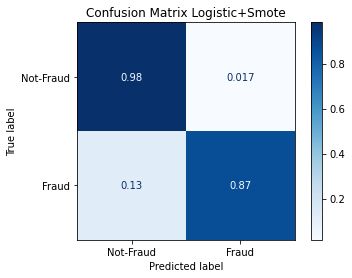

In [0]:
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
disp = plot_confusion_matrix(clf, X_test, y_test, cmap=plt.cm.Blues, normalize='true', display_labels=['Not-Fraud', 'Fraud']  )

disp.ax_.set_title('Confusion Matrix Logistic+Smote')
plt.show()


In [0]:

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))



              precision    recall  f1-score   support

           0       1.00      0.98      0.99     93825
           1       0.08      0.87      0.15       162

    accuracy                           0.98     93987
   macro avg       0.54      0.93      0.57     93987
weighted avg       1.00      0.98      0.99     93987

[[92224  1601]
 [   21   141]]


## SMOTE ENN

In [0]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, precision_recall_curve, auc, roc_auc_score, roc_curve, recall_score, classification_report
from time import time
from imblearn.combine import SMOTEENN
from imblearn.pipeline import Pipeline

parameters = {
    'lr__C': np.linspace(1, 100, 20 ),
    'lr__penalty': ['l1','l2']             }
lr = LogisticRegression()# Using Simple Logistic Regression

t0 = time()

sme = SMOTEENN( random_state=1)

#Doing Oversampling for every fold in CV and then using Logistic regression
pipeline=Pipeline([('sme',sme),(('lr', lr))])
clf = GridSearchCV(pipeline, parameters, cv=5, verbose=5, n_jobs=-1, scoring='f1_macro' )

clf.fit(X_train, y_train)

print("Best estimator found by grid search:")
print(clf.best_estimator_)
print("done in %0.3fs" % (time() - t0))

#  evaluation of the model quality on the test set

print("Predicting fraudulent transactions in test data")
t0 = time()
y_pred = clf.predict(X_test)
print("done in %0.3fs" % (time() - t0))


Fitting 5 folds for each of 40 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed: 26.3min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed: 33.2min finished
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0

Best estimator found by grid search:
Pipeline(memory=None,
         steps=[('sme',
                 SMOTEENN(enn=None, random_state=1, ratio=None,
                          sampling_strategy='auto', smote=None)),
                ('lr',
                 LogisticRegression(C=100.0, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=100,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=None,
                                    solver='lbfgs', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)
done in 2011.494s
Predicting fraudulent transactions in test data
done in 0.006s


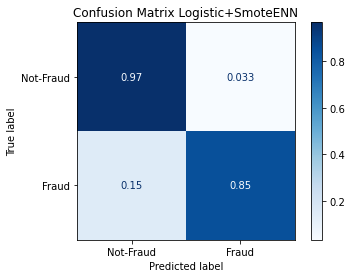

In [0]:
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
disp = plot_confusion_matrix(clf, X_test, y_test, cmap=plt.cm.Blues, normalize='true', display_labels=['Not-Fraud', 'Fraud']  )

disp.ax_.set_title('Confusion Matrix Logistic+SmoteENN')
plt.show()


In [0]:
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


              precision    recall  f1-score   support

           0       1.00      0.97      0.98     93825
           1       0.04      0.85      0.08       162

    accuracy                           0.97     93987
   macro avg       0.52      0.91      0.53     93987
weighted avg       1.00      0.97      0.98     93987

[[90733  3092]
 [   24   138]]


### UnderSampling

In [9]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from imblearn.under_sampling import NearMiss
from sklearn.metrics import confusion_matrix, precision_recall_curve, auc, roc_auc_score, roc_curve, recall_score, classification_report
from time import time
from imblearn.pipeline import Pipeline

nm=NearMiss(sampling_strategy='auto', random_state=None, version=1, n_neighbors=3)
parameters = {
    'lr__C': np.linspace(1, 100, 20 ),
    'lr__penalty': ['l1','l2']             }
             
lr = LogisticRegression()

t0 = time()
pipeline=Pipeline([('nm',nm),(('lr', lr))])
clf = GridSearchCV(pipeline, parameters, cv=5, verbose=5, n_jobs=-1)
clf.fit(X_train, y_train)
print("Best estimator found by grid search:")
print(clf.best_estimator_)
print("done in %0.3fs" % (time() - t0))

#  evaluation of the model quality on the test set

print("Predicting fraudulent transactions in test data")
t0 = time()
y_pred = clf.predict(X_test)
print("done in %0.3fs" % (time() - t0))


Fitting 5 folds for each of 40 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:   57.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  2.8min finished
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0

Best estimator found by grid search:
Pipeline(memory=None,
         steps=[('nm',
                 NearMiss(n_jobs=1, n_neighbors=3, n_neighbors_ver3=3,
                          random_state=None, ratio=None, return_indices=False,
                          sampling_strategy='auto', version=1)),
                ('lr',
                 LogisticRegression(C=73.94736842105263, class_weight=None,
                                    dual=False, fit_intercept=True,
                                    intercept_scaling=1, l1_ratio=None,
                                    max_iter=100, multi_class='auto',
                                    n_jobs=None, penalty='l2',
                                    random_state=None, solver='lbfgs',
                                    tol=0.0001, verbose=0, warm_start=False))],
         verbose=False)
done in 167.036s
Predicting fraudulent transactions in test data
done in 0.007s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


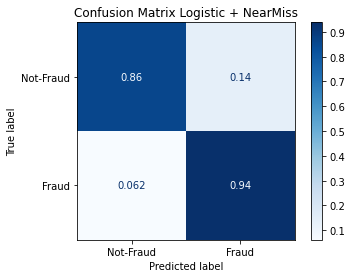

In [10]:
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
disp = plot_confusion_matrix(clf, X_test, y_test, cmap=plt.cm.Blues, normalize='true', display_labels=['Not-Fraud', 'Fraud']  )

disp.ax_.set_title('Confusion Matrix Logistic + NearMiss')
plt.show()


In [11]:
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


              precision    recall  f1-score   support

           0       1.00      0.86      0.92     93825
           1       0.01      0.94      0.02       162

    accuracy                           0.86     93987
   macro avg       0.51      0.90      0.47     93987
weighted avg       1.00      0.86      0.92     93987

[[80693 13132]
 [   10   152]]


In [23]:
clf.get_params

<bound method BaseEstimator.get_params of GridSearchCV(cv=5, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('nm',
                                        NearMiss(n_jobs=1, n_neighbors=3,
                                                 n_neighbors_ver3=3,
                                                 random_state=None, ratio=None,
                                                 return_indices=False,
                                                 sampling_strategy='auto',
                                                 version=1)),
                                       ('lr',
                                        LogisticRegression(C=1.0,
                                                           class_weight=None,
                                                           dual=False,
                                                           fit_intercept=True,
                                                           i

In [0]:
logistic=clf.best_estimator_.named_steps['lr']

In [25]:
logistic.coef_

array([[-3.26574341e-05,  2.97971517e-01, -5.79485898e-01,
        -7.79504177e-01,  8.51785217e-01,  2.58877016e-01,
        -2.06403939e-01, -4.56707154e-01, -1.68973751e-01,
        -4.81954035e-01, -4.92949193e-01,  7.01668610e-02,
        -3.58048844e-01, -3.23804041e-01, -1.05780757e+00,
        -1.90866443e-01, -3.98151904e-01, -5.91099316e-01,
        -7.57300309e-02,  7.29297217e-02, -1.27827022e-01,
         2.14464335e-01,  1.90134527e-01, -1.62580079e-01,
        -4.72442318e-02, -1.32040799e-01,  4.35707419e-02,
        -3.12927414e-02,  1.61632985e-02,  1.38858440e-02]])

Most important features are the ones with higest coefficients. They all have linear relationship to the odds of fraud

#### Random Forest with Near Miss

In [48]:
from sklearn.model_selection import RandomizedSearchCV
from time import time
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'RF__n_estimators': n_estimators,
               'RF__max_features': max_features,
               'RF__max_depth': max_depth,
               'RF__min_samples_split': min_samples_split,
               'RF__min_samples_leaf': min_samples_leaf,
               'RF__bootstrap': bootstrap}
RF = RandomForestClassifier()

pipeline=Pipeline([('nm',nm),(('RF', RF))])
clf = RandomizedSearchCV(pipeline, random_grid, cv=5, verbose=5, n_jobs=-1, n_iter=10)
clf.fit(X_train, y_train)
print("Best estimator found by grid search:")
print(clf.best_estimator_)
print("done in %0.3fs" % (time() - t0))

#  evaluation of the model quality on the test set

print("Predicting fraudulent transactions in test data")
t0 = time()
y_pred = clf.predict(X_test)
print("done in %0.3fs" % (time() - t0))



Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   49.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Best estimator found by grid search:
Pipeline(memory=None,
         steps=[('nm',
                 NearMiss(n_jobs=1, n_neighbors=3, n_neighbors_ver3=3,
                          random_state=None, ratio=None, return_indices=False,
                          sampling_strategy='auto', version=1)),
                ('RF',
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        class_weight=None, criterion='gini',
                                        max_depth=80, max_features='sqrt',
                                        max_leaf_nodes=None, max_samples=None,
                                        min_impurity_decrease=0.0,
                                        min_impurity_split=None,
                                        min_samples_leaf=4, min_samples_split=2,
                                        min_weight_fraction_leaf=0.0,
                                        n_estimators=600, n_jobs=None,
                        

In [0]:
Randomforest=clf.best_estimator_.named_steps['RF']

In [46]:
Randomforest.feature_importances_

array([0.00906814, 0.00734636, 0.01216963, 0.04948516, 0.11502898,
       0.01008637, 0.00798488, 0.0324525 , 0.00688489, 0.02650786,
       0.14292049, 0.05113747, 0.06342236, 0.0054755 , 0.16676858,
       0.00453307, 0.05795773, 0.10448889, 0.01748647, 0.01195154,
       0.01124081, 0.02000226, 0.00388675, 0.0064645 , 0.00323554,
       0.00522401, 0.00486008, 0.00425756, 0.00594811, 0.0317235 ])

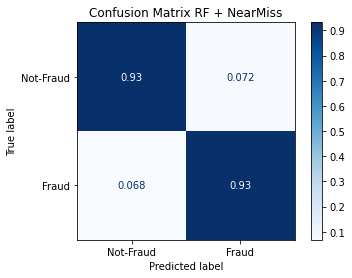

In [0]:
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
disp = plot_confusion_matrix(clf, X_test, y_test, cmap=plt.cm.Blues, normalize='true', display_labels=['Not-Fraud', 'Fraud']  )

disp.ax_.set_title('Confusion Matrix RF + NearMiss')
plt.show()


In [0]:
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


              precision    recall  f1-score   support

           0       1.00      0.93      0.96     93825
           1       0.02      0.93      0.04       162

    accuracy                           0.93     93987
   macro avg       0.51      0.93      0.50     93987
weighted avg       1.00      0.93      0.96     93987

[[87091  6734]
 [   11   151]]


# INFERENCES:
1)The best Model is : Random forest with near miss with Recall of(Fraud)= 0.93and Precision of Non-Fraud=: 1

2)In order to examine the effect of Handling Imbalance classes, For this dataset, Nearmiss does a better job than SMOTE and SMOTE+ENN

3) The scores reflect percentages like off the Fraud classes in test data how many were correcty predicted, The confusion matrix represents this percentage

